In [1]:
path_img = 'D:/Salve_Aqui_Seus_Arquivos/harley/TETI/Imagens/teti_imagens/'
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image, ImageOps
%matplotlib inline
from pylab import *
import cv2

In [7]:
im1 = cv2.imread(path_img + 'mesa_1.jpg')
im2 = cv2.imread(path_img + 'mesa_2.jpg')

In [3]:
def mostra2_img(titulo, im1, im2):
    cv2.imshow(titulo, np.hstack((im1, im2)))
    cv2.waitKey(0)
    cv2.destroyAllWindows()

def mostra3_img(titulo, im1, im2, im3):
    cv2.imshow(titulo, np.hstack((im1, im2, im3)))
    cv2.waitKey(0)
    cv2.destroyAllWindows()

In [31]:
def mostra_img(titulo, im1):
    cv2.imshow(titulo, im1)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

In [8]:
im3 = im1-im2

In [10]:
mostra3_img('Comparação', im1, im2, im3)

In [11]:
im4 = cv2.absdiff(im1, im2)

In [12]:
mostra3_img('Comparação', im1, im2, im4)

In [13]:
k1 = np.array([[-1, -1, -1],
               [-1, 9, -1],
               [-1, -1, -1]])

In [28]:
k2 = np.array([[1, 0, 0],
               [0, 0, 0],
               [0, 0, -1]])

In [14]:
im_pap = cv2.imread(path_img + 'papagaio_amarelo.jpg')

In [15]:
im_filtro_k1 = cv2.filter2D(im_pap, -1, k1)

In [16]:
mostra2_img('Papagaio', im_pap, im_filtro_k1)

In [17]:
im_ag = cv2.imread(path_img + 'testes.jpg')

In [29]:
im_filtro_k1 = cv2.filter2D(im_ag, -1, k2)

In [61]:
mostra_img('Papagaio', im_filtro_k1)

In [33]:
k3 = np.array([[0, 0, 0],
               [0, 1, 0],
               [0, 0, 0]])

In [34]:
im_k3 = cv2.filter2D(im_ag, -1, k3)

In [59]:
mostra2_img('Ag', im_ag, im_k3)

In [41]:
k4 = np.array([[0, -1, 0],
               [-1, 9, -1],
               [0, -1, 0]])

In [42]:
im_k4 = cv2.filter2D(im_ag, -1, k4)

In [43]:
mostra2_img('Ag', im_ag, im_k4)

In [51]:
im_ag = cv2.imread(path_img + 'testes.jpg')
im_ag_med = cv2.medianBlur(im_ag, 3)
im_resultado = im_ag - im_ag_med

In [53]:
mostra3_img('Agatha media', im_ag, im_ag_med, im_resultado)

In [46]:
im_tig = cv2.imread(path_img + 'tigre_saltpepper.png')
im_tig_med = cv2.medianBlur(im_tig, 5)
im_resultado = im_tig - im_tig_med

In [47]:
mostra3_img('Tigre media', im_tig, im_tig_med, im_resultado)

In [48]:
im_atenas = cv2.imread(path_img + 'atenas_saltpepper.png')
im_atenas_media = cv2.medianBlur(im_atenas, 3)
im_resultado = im_atenas - im_atenas_media

In [49]:
mostra3_img('Atenas média', im_atenas, im_atenas_media, im_resultado)

# Parte de vídeo

In [55]:
video = path_img + 'mont_russa.mp4'

In [67]:
cap = cv2.VideoCapture(video)
cont = 1
if cap.isOpened():
    ret, frame = cap.read()
else:
    ret = false

while ret:
    ret, frame = cap.read()
    if frame is not None:
        cv2.imwrite(path_img + 'frames/' + str(cont) + '.jpg', frame)
        cont += 1
    cv2.waitKey(1)
cap.release()
print('Finalizou')

Finalizou


## Exercicio filtro

In [63]:
cap = cv2.VideoCapture(video)
cont = 1
if cap.isOpened():
    ret, frame = cap.read()
else:
    ret = false

while ret:
    ret, frame = cap.read()
    if frame is not None:
        cv2.imwrite(path_img + 'frames/' + str(cont) + '.jpg', cv2.filter2D(frame, -1, k2))
        cont += 1
    cv2.waitKey(1)
cap.release()
print('Finalizou')

Finalizou


## Exercicio ZOOM

In [78]:
def mostra_vid(titulo, video):
    cv2.imshow(titulo, video)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

In [79]:
mostra_vid('Teste', cap)

error: OpenCV(4.10.0) :-1: error: (-5:Bad argument) in function 'imshow'
> Overload resolution failed:
>  - mat is not a numpy array, neither a scalar
>  - Expected Ptr<cv::cuda::GpuMat> for argument 'mat'
>  - Expected Ptr<cv::UMat> for argument 'mat'


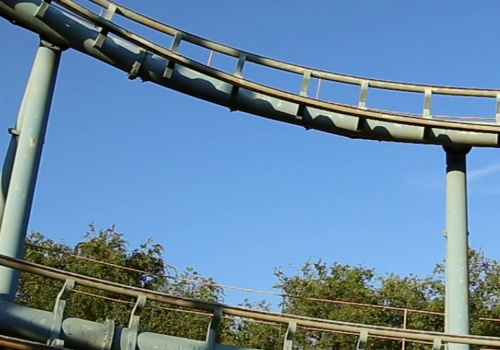

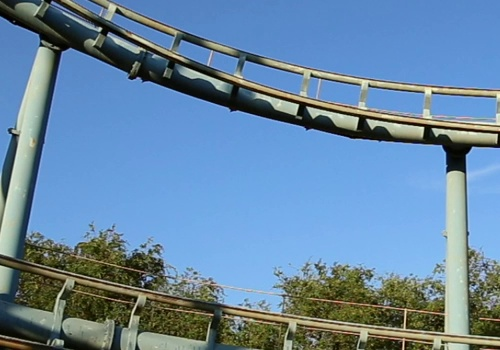

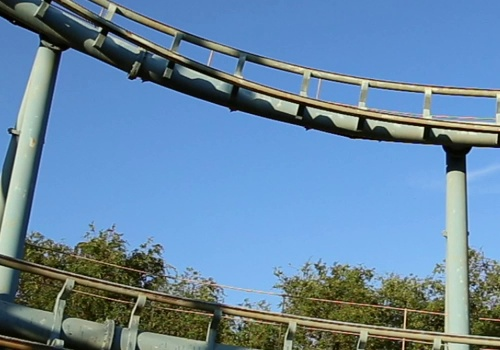

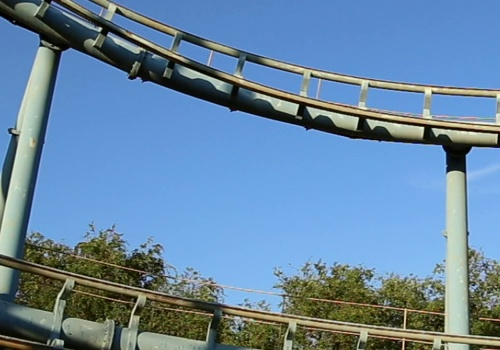

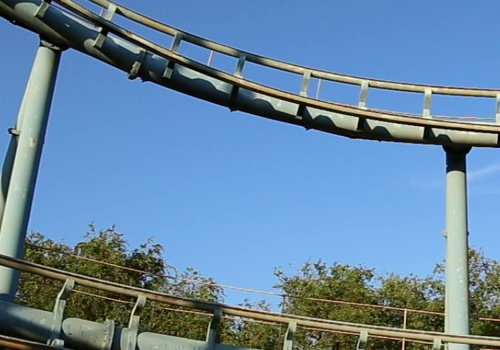

...

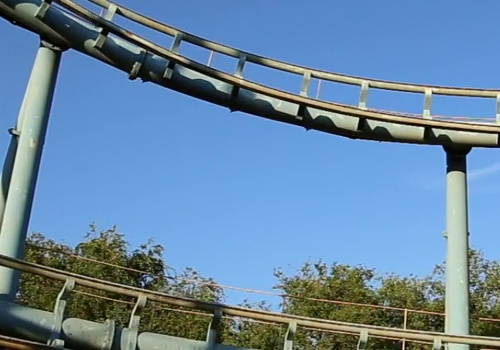

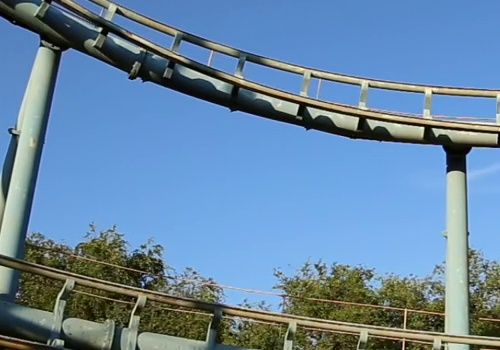

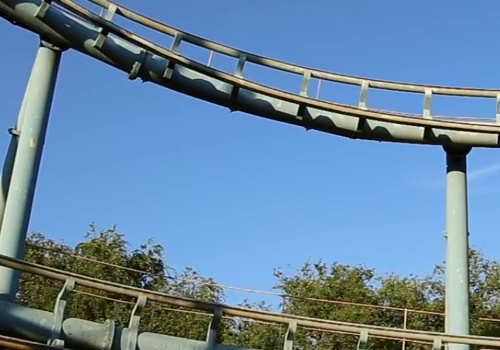

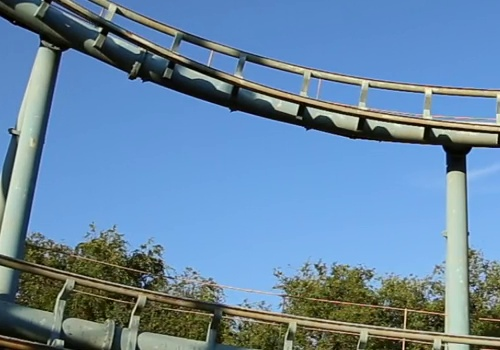

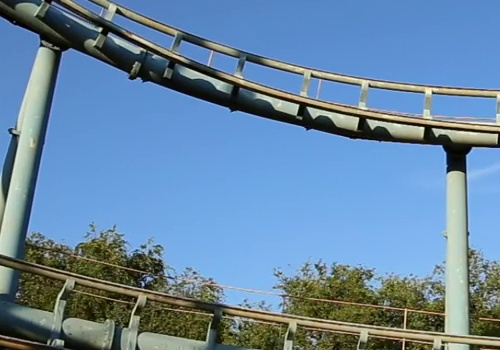

Finalizou


In [77]:
cap = cv2.VideoCapture(video)
cont = 1
if cap.isOpened():
    ret, frame = cap.read()
else:
    ret = false

while ret:
    ret, frame = cap.read()
    if frame is not None:
        _, img_encoded = cv2.imencode('.jpg', frame[200:550, 200:700])
        display(Image(data = img_encoded))
        cont += 1
    cv2.waitKey(1)
cap.release()
print('Finalizou')

## Exercicio em tempo real

In [ ]:
cap = cv2.VideoCapture(video)
cont = 1
if cap.isOpened():
    ret, frame = cap.read()
else:
    ret = false

while ret:
    ret, frame = cap.read()
    if frame is not None:
        _, img_encoded = cv2.imencode('.jpg', frame)
        display(Image(data = img_encoded))
        cont += 1
    k = cv2.waitKey(1)
    if k & 0xFF == ord('q'):
        break
    
cap.release()
print('Finalizou')